In [182]:
"""
Created By    : Aanan Schlief
Creation Date : 12/2/2022
Course        : ATSC 528 - Atmospheric Data Analysis
Assignment    : #03 - Statistical Objective Analysis

Purpose:
Script to take sparse upper air observations and analyze them on a
polar stereographic map projection using statistical objective analysis.
[PUT MORE INFORMATION HERE - I.E., WHAT SPECIFIC THING IS BEING DONE]

This code shows the Univariate Statistical Objective Analysis (SOA) technique to analyze 500 mb height data. 
First, the code calculates the background field from a one pass Barnes analysis to perform the analysis. Next, we use forward 
interpolation at the observation stations to then find the background at the observation stations. 
The code will then get the observation increments for the observations based on background that was found in the previous step. 
A correlation matrix is then calculated that will find the observation points that are closest to our analyzied points.
Next, the background error is calculated for this difference between the obs points and the analysis points that 
will then be used to create weights. The weights are used to find the analysis and the analysis background for the 
specified number of observation points (N=2,4,10) which are then plotted and saved into text files. 


"""
__author__    = "Jared Marquis"
__contact__   = "jared.marquis@und.edu"

In [183]:
### Import Required Modules (shouldn't need to change) ###
import numpy as np                 #numpy for math
import matplotlib.pyplot as plt    #matplotlib for plotting
import cartopy.crs as ccrs         #cartopy for plotting on map
import cartopy.feature as cfeature #cartopy basic shapefiles 
import pandas as pd

In [184]:
global K_d
global r_e
global phi_lat
global range_factor
global scale

In [185]:
K_d = 10.8844524
r_e = 12.7775892
phi_lat = 60 * (np.pi/180)
range_factor = ((1+np.sin(40*(np.pi/180)))/(1+np.sin(phi_lat))) * -1.24

In [186]:
def bilinear_interpolation(x_obs, y_obs, a_obs):
    
    xindex = ((x_obs - 18.90) / 1.27)
    yindex = ((y_obs - (-6.3)) / 1.27)   
    matrix = np.matrix([[1, -1, -1, 1],[0, 0, 1, -1],[0, 1, 0, -1],[0, 0, 0, 1]])
    di = (xindex - np.floor(xindex))
    dj = (yindex - np.floor(yindex))
    xindex = int(np.floor(xindex))
    yindex = int(np.floor(yindex))
    a_matrix = np.matrix([1, di, dj, di*dj]).T
    f_matrix = np.matrix([a_obs[yindex, xindex],
            a_obs[yindex,xindex+1],
            a_obs[yindex+1,xindex],
             a_obs[yindex+1,xindex+1]])
    
    return f_matrix * matrix * a_matrix

In [187]:
def barnes(gx, gy, f_not):
    weights = np.empty(len(gx))
    for i in range(len(gx)):
        dik = (gx[i]**2 + gy[i]**2)**0.5
        weight = np.exp((-dik**2)/K_d)
        weights[i] = weight
    return (np.nansum(weights*f_not)/np.sum(weights))

In [188]:
def analysis_at_stations(num_N, analysis):
    
    for i in range(len(height_500)):
        if x_observ[i] > np.amin(gx) and \
            x_observ[i] < np.amax(gx) and \
            y_observ[i] > np.amin(gy) and \
            y_observ[i] < np.amax(gy):
                analysis_at_obs[i, num_N] = bilinear_interpolation(x_observ[i], y_observ[i], analysis[:,:,num_N])
        else:
            rad_conv = ((x_observ[i]-gx)**2 + (y_observ[i]-gy)**2)**0.5
            if np.min(rad_conv) > r_e:
                analysis_at_obs[i, num_N] = np.nan
            else:
                indexes_radii = np.where(rad_conv <= r_e)
                rel_xb = (x_observ[i] - gx[indexes_radii]).flatten()
                rel_yb = (y_observ[i] - gy[indexes_radii]).flatten()
                heights = (analysis[:,:,num_N][indexes_radii]).flatten()
                analysis_at_obs[i, num_N] = barnes(rel_xb, rel_yb, heights)

In [189]:
def background_error_correlation(N, gx, gy, obs_i):
    matrix = np.zeros([N, N])
    
    for i in range(N):
        for j in range(N):
            diff_x = gx[obs_i[j]] - gx[obs_i[i]]
            diff_y = gy[obs_i[j]] - gy[obs_i[i]]
            s_ = (diff_x**2 + diff_y**2) **0.5
            globe = s_ / scale
            globe_conversion = (globe)/(1000*1000*100)
            rho_scale = 0.95*np.exp((range_factor*(globe_conversion**2)))
            if rho_scale == 0.95:
                matrix[i,j] = 1
            else:
                matrix[i,j] = rho_scale
    return np.linalg.inv(np.matrix(matrix))


In [190]:
def define_background_observations(radius_of_influence):
    
    for i in range(len(height_500)):
        if x_observ[i] > np.amin(gx) and \
            x_observ[i] < np.amax(gx) and \
            y_observ[i] > np.amin(gy) and \
            y_observ[i] < np.amax(gy):
                bg_obs[i] = bilinear_interpolation(x_observ[i], y_observ[i], bg_analysis[:,:])
        else: 
            rad_conv = ((x_observ[i]-gx)**2 + (y_observ[i]-gy)**2)**0.5
            if np.min(rad_conv) > radius_of_influence:
                bg_obs[i] = np.nan
            
            else:
                indexes_radii = np.where(rad_conv <= radius_of_influence)
                rel_xb = (x_observ[i] - gx[indexes_radii]).flatten()
                rel_yb = (y_observ[i] - gy[indexes_radii]).flatten()
                heights = (bg_analysis[:,:][indexes_radii]).flatten()
                bg_obs[i] = barnes(rel_xb, rel_yb, heights) 

In [191]:
def background_error_grid(N, gx, gy, pt_x, pt_y, obs_i):
    matrix2 = np.zeros([N])
    
    for i in range(N):
        diff_x = gx[obs_i[i]] - pt_x
        diff_y = gy[obs_i[i]] - pt_y
        s_ = (diff_x**2 + diff_y**2)**0.5
        globe = s_ / scale
        globe_conversion = (globe)/(1000*1000*100)
        rho_scale = 0.95*np.exp((range_factor*(globe_conversion**2)))
        matrix2[i] = rho_scale
    
    return np.matrix(matrix2)

In [192]:
fi = pd.read_csv("./RAOBs_201903131200.txt", sep=",", names = ["Station ID","Latitude", "Longitude", "500 mb Height (m)", "500 mb Wind Direction", "500 mb Wind Speed(knots)"])
lon = fi["Longitude"]
lat = fi["Latitude"]
height_500 = fi["500 mb Height (m)"]
fi.head()

,Station ID,Latitude,Longitude,500 mb Height (m),500 mb Wind Direction,500 mb Wind Speed(knots)
0,CWPL,51.47,-90.2,5460.0,285.0,29.0
1,CWQI,43.83,-66.0,5540.0,325.0,41.0
2,CWSE,53.55,-113.9,5360.0,280.0,12.0
3,CYAH,53.75,-73.6,5340.0,300.0,70.0
4,CYBK,64.30,-96.0,5220.0,95.0,17.0


In [193]:
x = 22
y = 28

### convert obs lat/long to x,y ###
roe = 6371 * 1e5
scale = 1/(15e6)
llambda = -115

#constants                            
sigma = (1 + np.sin(phi_lat))/(1 + np.sin((lat * (np.pi/180))))
r = roe * sigma * (np.cos(lat * (np.pi/180))) * scale
y_observ = r * np.sin(((lon * (np.pi/180)) - (llambda * (np.pi/180))))
x_observ = r * np.cos(((lon * (np.pi/180)) - (llambda * (np.pi/180))))


### Set up analysis map with a 22x28 rectangular grid of points ###
gridx = 18.9 + np.arange(22)*(1.27)                       #set x step
gridy = -6.3 + np.arange(28)*(1.27)                       #set y step
gx,gy = np.meshgrid(gridx, gridy)                        #set grid points

In [194]:
#define gridlon and gridlat
gridlon = np.arctan(gy/gx) * (180/np.pi) + llambda
gridlat = (180/np.pi) * ((np.pi/2) - (2*np.arctan(np.sqrt((gx/scale)**2+(gy/scale)**2)/(roe*(1+np.sin(phi_lat))))))

In [195]:
#set empty arrays to store values
bg_obs = np.empty((len(height_500)))
bg_analysis = np.empty((y, x))
analysis_i = np.empty((y, x, 3))
analysis_at_obs = np.empty((len(height_500), 3))
analysis_d = np.empty((len(height_500), 3))
analysis = np.empty((y, x, 3))

In [196]:
for i in range(len(gx)):
    for j in range(len(gx[0])):
        rel_x = gx[i, j] - x_observ
        rel_y = gy[i, j] - y_observ
        rel_rad = (rel_x**2 + rel_y**2) **0.5
        index_radiis = np.where(rel_rad<r_e)[0]
        x_k = rel_x[index_radiis].values
        y_k = rel_y[index_radiis].values
        f_not = height_500[index_radiis].values            
        bg_analysis[i, j] = barnes(x_k, y_k, f_not)


In [197]:
#establish the observation background field
define_background_observations(r_e)

#get our increments for obsservations
obs_incs = height_500 - bg_obs

In [198]:
#use given N values for closest stations
n_values = [2,4,10]

for n in range(len(n_values)):
    N = n_values[n]
    for i in range (len(gx)):
        for j in range(len(gx[0])):
            rel_x = gx[i, j] - x_observ
            rel_y = gy[i, j] - y_observ
            rel_rad = (rel_x**2 + rel_y**2) **0.5
            observ = np.argsort(rel_rad)[0:N]
            x_k = x_observ[observ]
            y_k = y_observ[observ]
            heights = obs_incs[observ]
            matrix = background_error_correlation(N, x_k, y_k, observ)
            rhovector = background_error_grid(N, x_k, y_k, gx[i,j], gy[i,j], observ) 
            weights = rhovector*matrix
            values = np.empty([N])
            for k in range(N):
                values[k] = weights[0,k] * obs_incs[observ[k]]
            analysis[i,j,n] = bg_analysis[i,j] + (np.sum(values))
    analysis_at_stations(n, analysis)

In [199]:
#calculate analysis increments 
analysis_i[:,:,0] = analysis[:,:,0] - bg_analysis[:,:]
analysis_i[:,:,1] = analysis[:,:,1] - bg_analysis[:,:]
analysis_i[:,:,2] = analysis[:,:,2] - bg_analysis[:,:]

#calculate analysis diffferences
analysis_d[:,0] = analysis_at_obs[:,0] - height_500
analysis_d[:,1] = analysis_at_obs[:,1] - height_500
analysis_d[:,2] = analysis_at_obs[:,2] - height_500

In [200]:
#get the rms sum to then get our rms values 
rmsum1 = (analysis_at_obs[:,0] - height_500)**2
rmsum1 = rmsum1[~np.isnan(rmsum1)]
rmsum2 = (analysis_at_obs[:,1] - height_500)**2
rmsum2 = rmsum2[~np.isnan(rmsum2)]
rmsum3 = (analysis_at_obs[:,2] - height_500)**2
rmsum3 = rmsum3[~np.isnan(rmsum3)]

#Use rmsum to then get the rms values 
rmsval1 = np.sqrt((np.sum(rmsum1))/len(rmsum1))
rmsval2 = np.sqrt((np.sum(rmsum2))/len(rmsum2))
rmsval3 = np.sqrt(np.sum(rmsum3)/len(rmsum3))
print(rmsval2)
print(rmsval1)
print(rmsval3)

49.96061067453241
51.919230525837634
50.972424876320204


C:\Users\aanan\anaconda3\lib\site-packages\cartopy\crs.py:245: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
C:\Users\aanan\anaconda3\lib\site-packages\cartopy\crs.py:297: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
C:\Users\aanan\anaconda3\lib\site-packages\cartopy\crs.py:364: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


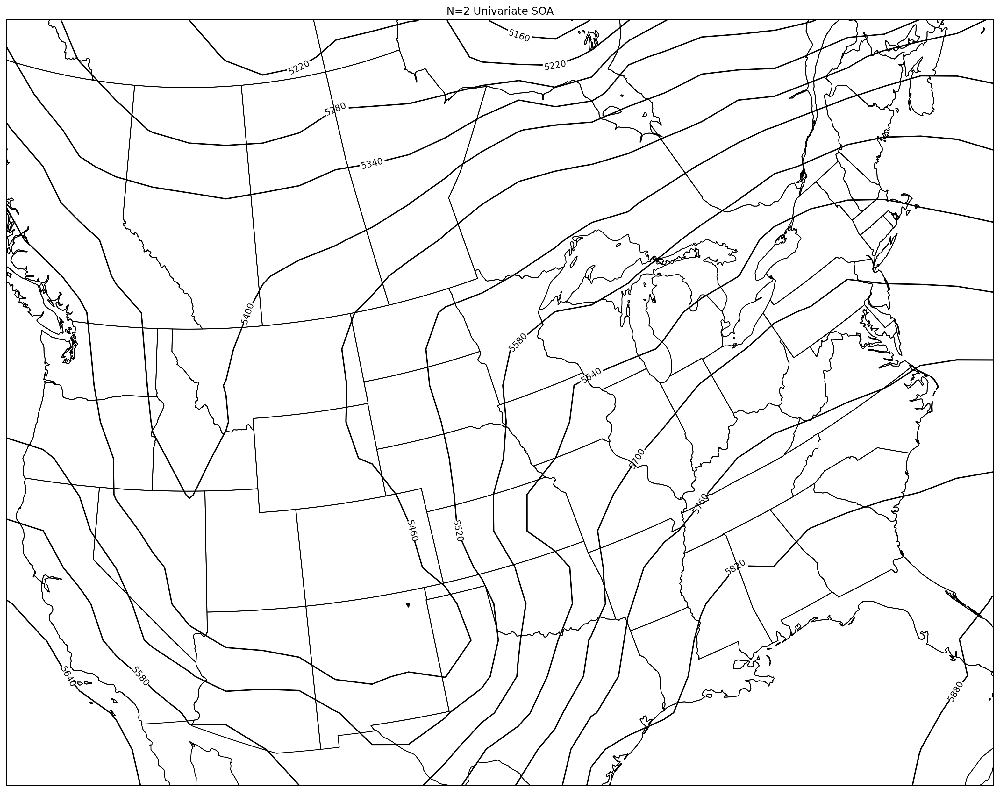

In [201]:
#plot N = analysis arrays 
fig = plt.figure(figsize = (20,20), dpi = 200)
proj = ccrs.Stereographic(central_longitude=-115, central_latitude=90, true_scale_latitude = 60)
ax1 = plt.subplot(111, projection = proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

cs1 = ax1.contour(gridlon, gridlat, analysis[:,:,0], colors = 'black', levels = np.arange(0,8000,60), transform = ccrs.PlateCarree())
plt.clabel(cs1, levels=np.arange(0,8000,60))
plt.title('N=2 Univariate SOA')
plt.savefig('N=2 Univariate SOA')
plt.show()

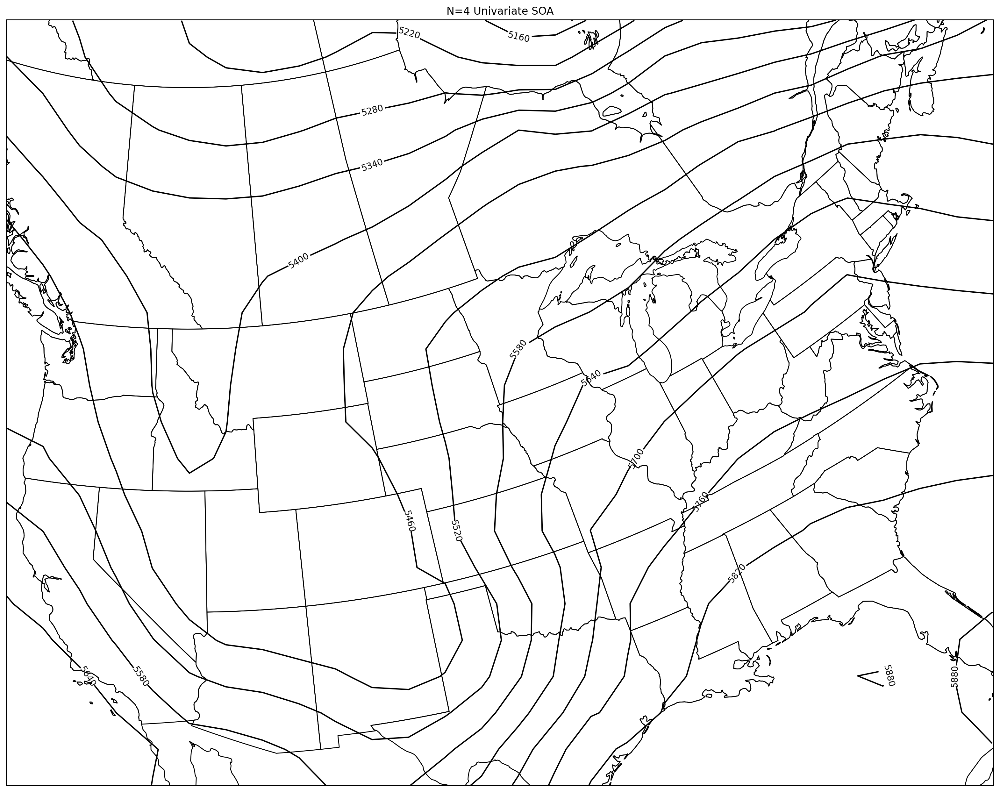

In [202]:
fig = plt.figure(figsize = (20,20), dpi = 200)
proj = ccrs.Stereographic(central_longitude=-115, central_latitude=90, true_scale_latitude = 60)
ax1 = plt.subplot(111, projection = proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

cs1 = ax1.contour(gridlon, gridlat, analysis[:,:,1], colors = 'black', levels = np.arange(0,8000,60), transform = ccrs.PlateCarree())
plt.clabel(cs1, levels=np.arange(0,8000,60))
plt.title('N=4 Univariate SOA')
plt.savefig('N=4 Univariate SOA')
plt.show()

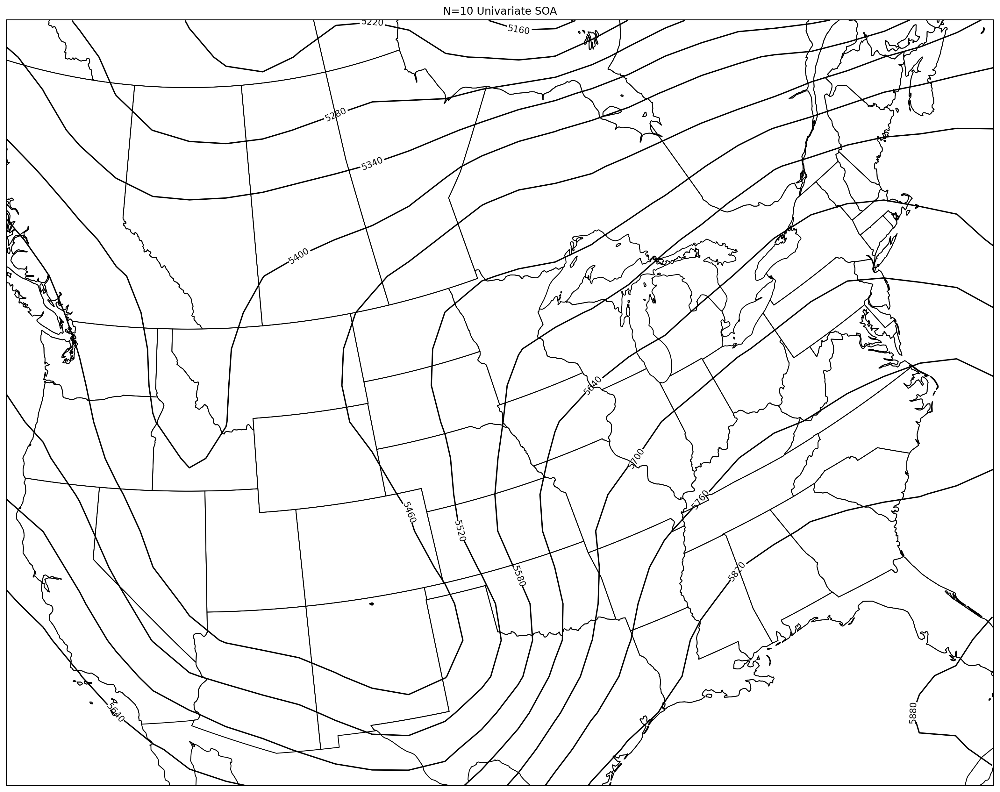

In [203]:
fig = plt.figure(figsize = (20,20), dpi = 200)
proj = ccrs.Stereographic(central_longitude=-115, central_latitude=90, true_scale_latitude = 60)
ax1 = plt.subplot(111, projection = proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

cs1 = ax1.contour(gridlon, gridlat, analysis[:,:,2], colors = 'black', levels = np.arange(0,8000,60), transform = ccrs.PlateCarree())
plt.clabel(cs1, levels=np.arange(0,8000,60))
plt.title('N=10 Univariate SOA')
plt.savefig('N=10 Univariate SOA')
plt.show()

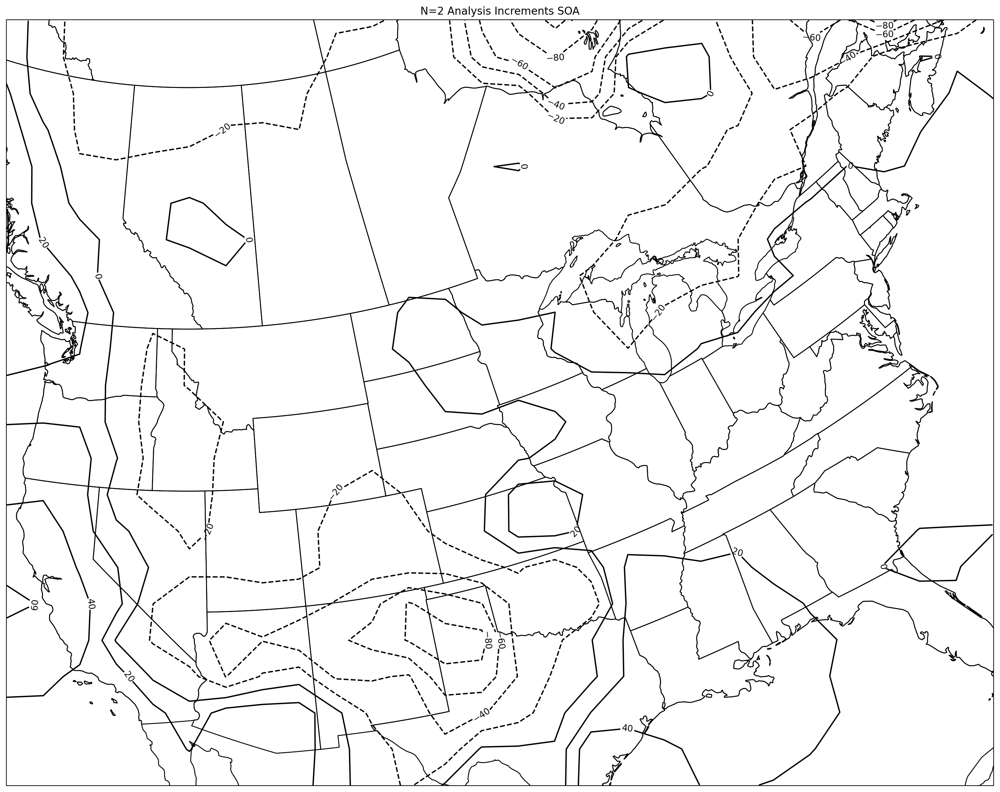

In [204]:
#plot analysis increments 
fig = plt.figure(figsize = (20,20), dpi = 200)
proj = ccrs.Stereographic(central_longitude=-115, central_latitude=90, true_scale_latitude = 60)
ax1 = plt.subplot(111, projection = proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

cs1 = ax1.contour(gridlon, gridlat, analysis_i[:,:,0], colors = 'black', levels = np.arange(-500,500,20), transform = ccrs.PlateCarree())
plt.clabel(cs1, levels=np.arange(-500,500,20))
plt.title('N=2 Analysis Increments SOA')
plt.savefig('N=2 Analysis Increments SOA')
plt.show()

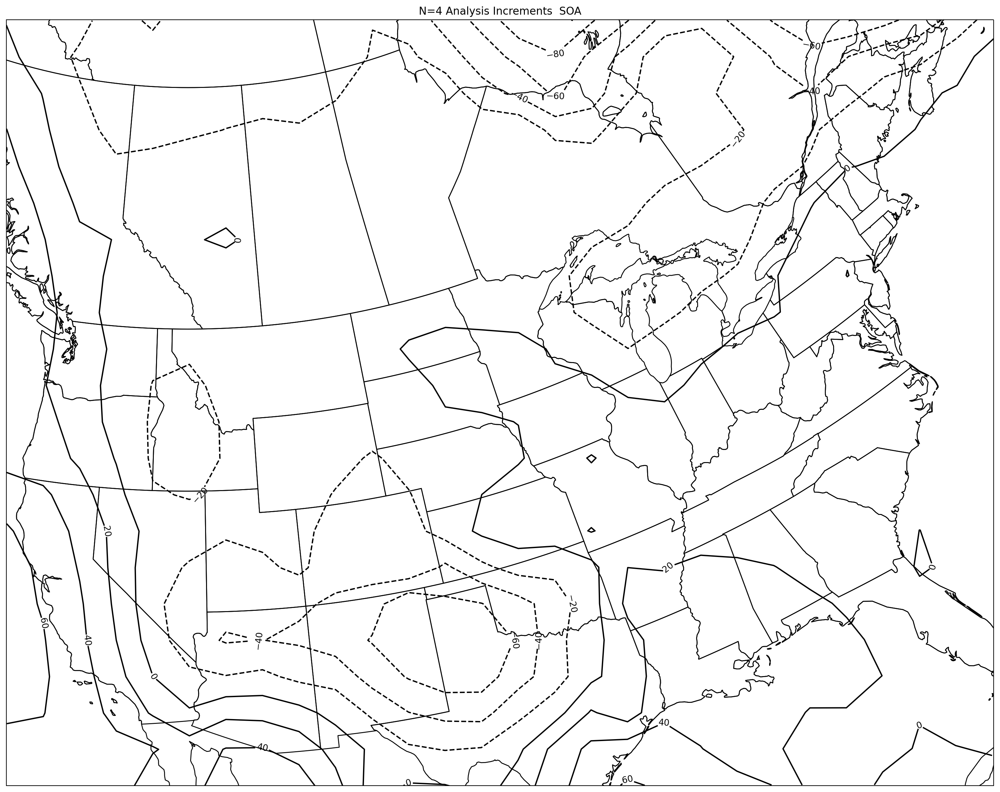

In [205]:
fig = plt.figure(figsize = (20,20), dpi = 200)
proj = ccrs.Stereographic(central_longitude=-115, central_latitude=90, true_scale_latitude = 60)
ax1 = plt.subplot(111, projection = proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

cs1 = ax1.contour(gridlon, gridlat, analysis_i[:,:,1], colors = 'black', levels = np.arange(-500,500,20), transform = ccrs.PlateCarree())
plt.clabel(cs1, levels=np.arange(-500,500,20))
plt.title('N=4 Analysis Increments  SOA')
plt.savefig('N=4 Analysis Increments SOA')
plt.show()

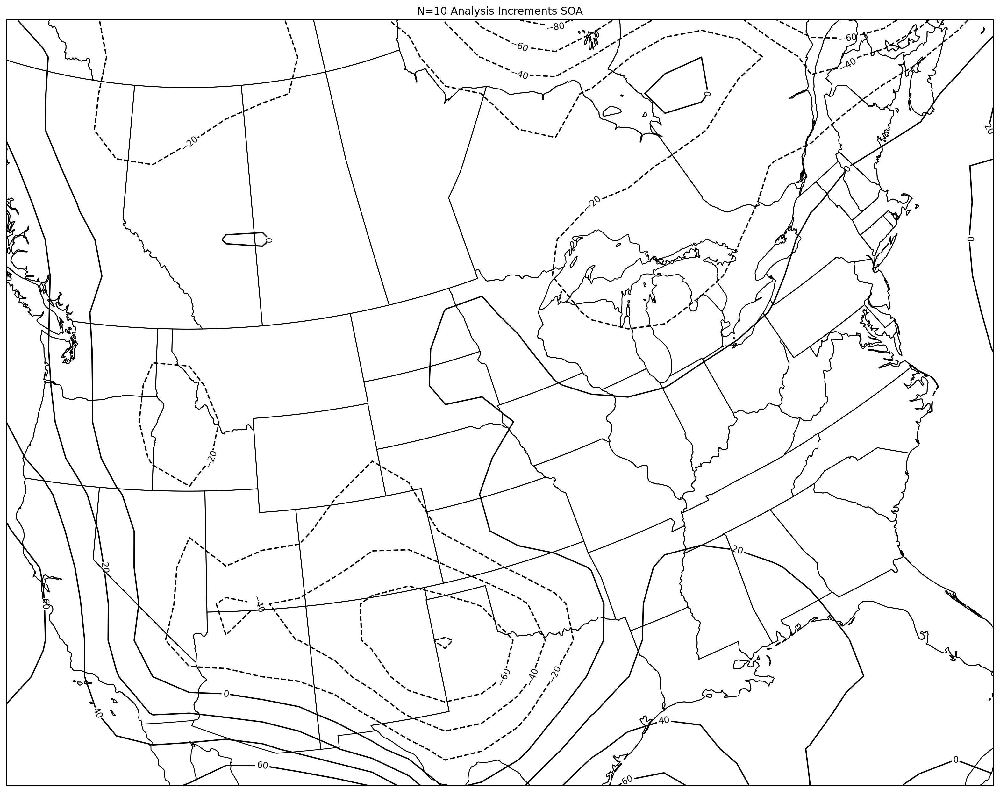

In [206]:
fig = plt.figure(figsize = (20,20), dpi = 200)
proj = ccrs.Stereographic(central_longitude=-115, central_latitude=90, true_scale_latitude = 60)
ax1 = plt.subplot(111, projection = proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

cs1 = ax1.contour(gridlon, gridlat, analysis_i[:,:,2], colors = 'black', levels = np.arange(-500,500,20), transform = ccrs.PlateCarree())
plt.clabel(cs1, levels=np.arange(-500,500,20))
plt.title('N=10 Analysis Increments SOA')
plt.savefig('N=10 Analysis Increments SOA')
plt.show()

In [207]:
# Save analysis to text files
with open('SOA_N2.txt', 'w+') as f:
    f.write('grid_point, analysis_value, analysis_increment\n')
    for i in range(len(gx)):
        for j in range(len(gx[0])):
            grid_point = str([i,j])
            analysis_v = str(analysis[i,j,0])
            analysis_inc = str(analysis_i[i,j,0])
            out_string = grid_point + ',' + analysis_v + ',' + analysis_inc + '\n'
            f.write(out_string)

In [208]:
with open('SOA_N4.txt', 'w+') as f:
    f.write('grid_point, analysis_value, analysis_increment\n')
    for i in range(len(gx)):
        for j in range(len(gx[0])):
            grid_point = str([i,j])
            analysis_v = str(analysis[i,j,1])
            analysis_inc = str(analysis_i[i,j,1])
            out_string = grid_point + ',' + analysis_v + ',' + analysis_inc + '\n'
            f.write(out_string)

In [209]:
with open('SOA_N10.txt', 'w+') as f:
    f.write('grid_point, analysis_value, analysis_increment\n')
    for i in range(len(gx)):
        for j in range(len(gx[0])):
            grid_point = str([i,j])
            analysis_v = str(analysis[i,j,2])
            analysis_inc = str(analysis_i[i,j,2])
            out_string = grid_point + ',' + analysis_v + ',' + analysis_inc + '\n'
            f.write(out_string)

In [210]:
#save analysis differences to text files 
with open('SOA_differences.txt', 'w+') as f:
    f.write('observation_point, N, analysis_diff\n')
    for n in range(len(n_values)):
        num_N = n_values[n]
        for i in range(len(height_500)):
            observation_point = str(i)
            analysis_diff = str(analysis_d[i,n])
            out_string = observation_point + ',' + str(num_N) + ',' + analysis_diff + '\n'
            f.write(out_string)

In [ ]:
### In a separte text file (or below), answer the following questions ###
'''
1 - Describe the general features that you see in your contoured analyses.
    
    In our countoured analysis we can see a trough over the Western United States and a ridge over the Eastern United States 

2 - Describe the differences that you see in your contoured analyses.  
    Does one analysis seem to be smoother than the other?  If so, what would cause this?
    
    The N=10 plot appears to be the smoothest of the three plots, while the N=2 is the most jagged plot and the N=4 appears 
    to be slightly less jagged than the N=2 but not quite as smooth as the N=10. I would assume that the N=2 plot is the most jagged 
    because there are less points are being taken into consideration meaning that our contours will become more jagged. As we increase
    the amount of points being taken into consideration (i.e. N=10) we are able to smooth out those jagged contours with more points and
    therefore more data allowing for a better representation of larger scale features. If you want to see the smaller scale features 
    the N=2 or the N=4 plot allows you to see smaller scale features. 


3 - What happens as you increase the number of points considered for the analysis?  Is this 
    desirable?  Why or why not?
    
    As you increase the number of points you are trending towards a smoother analysis as we saw in the comparison of the N=2 
    plot versus the N=10 plot. If you want to see smaller scale features decreasing the number of points works better while
    increasing the number of points provides a more smoothed out analysis to examine larger scale features. So, depending on 
    if you desire smaller scale features or larger scale features you can increase the number of points to see large scale features
    while deceasing the number of points creates a more jagged analysis but allows you to see smaller scale features. 
    
'''